

---


**<h1><center>Conceptual Graph-Based Recommendation System for monitoring RM issues</center></h1>**

---


<center>Realised By: Haifa laabidi- Yosra Karoui - Eya Gharbi - Maryem Awaidia - Zeineb Bensalem - Hela Jlassi</center>

---



<hr>


## Part 1 PMBOOK

## Installing and importing Modules

In [ ]:
# Install Tesseract
!apt-get install tesseract-ocr

# Install pytesseract
!pip install pytesseract

# Import pytesseract
import pytesseract

# Add pytesseract executable path to the system PATH
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.


In [ ]:
# Install Poppler
!apt-get install poppler-utils

# Add Poppler to PATH
import os
os.environ['PATH'] += ":/usr/local/bin"

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 18 not upgraded.


In [ ]:
pip install pdf2image

In [ ]:
pip install pytesseract

In [ ]:
pip install PyPDF2

In [ ]:
!pip install fitz

In [ ]:
pip install frontend


In [ ]:
from pdf2image import convert_from_path

In [ ]:
from pytesseract import image_to_string

In [ ]:
from PIL import Image

In [ ]:
import csv

In [ ]:
import re

In [ ]:
import PyPDF2

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

In [ ]:
content_df_file = "/content/drive/My Drive/content_df.csv"
# Check if the CSV file exists in Google Drive
if os.path.exists(content_df_file):
    # Load the DataFrame from the existing CSV file
    content_df = pd.read_csv(content_df_file)
    content_df.fillna('', inplace=True)

### Extracting figures

In [ ]:
# Path to the PDF file
pdf_file_path = "/content/PMBOK6-2017.pdf"

# Directory where you want to save the screenshots
output_folder = "screenshots"
figures_folder ="figures"
modified_output_folder = "modified_screenshots"
output_pdf_path = "output.pdf"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)
os.makedirs(figures_folder, exist_ok=True)
os.makedirs(modified_output_folder, exist_ok=True)

# Open the PDF file
pdf_document = fitz.open(pdf_file_path)

# Iterate through all pages in the PDF
# for page_number, page in enumerate(pdf_document):
for page_number in range(1, len(pdf_document)):
    page = pdf_document[page_number]
    # Calculate the height of the entire page
    page_height = page.bound().height
    page_width = page.bound().width

    # Height of the footer to be removed (in pixels)
    footer_height_pixels = 80  # You can adjust this value if needed

    # Calculate the cropping height to exclude the footer
    cropping_height = page_height - footer_height_pixels

    # Take a screenshot of the page with the footer removed
    screenshot = page.get_pixmap(matrix=fitz.Matrix(2, 2), clip=(0, 0, page_width, cropping_height))

    # Specify the filename for the screenshot
    # screenshot_filename = f"page_{page_number + 1}.png"
    screenshot_filename = f"page_{page_number}.png"

    # Specify the full path to save the screenshot in the output folder
    screenshot_path = os.path.join(output_folder, screenshot_filename)

    # Save the screenshot
    screenshot.save(screenshot_path, "png")

    # DETECTING FIGURES

    # Load the saved screenshot image
    image = cv2.imread(screenshot_path)

    # Convert the image to grayscale
    image_grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection
    edges = cv2.Canny(image_grayscale, threshold1=30, threshold2=100)

    # Find contours in the edge-detected image
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image to draw bounding boxes
    image_with_boxes = image.copy()

    # Loop through all detected contours
    for contour in contours:
        id=1
        x, y, w, h = cv2.boundingRect(contour)

        # Check if the width and height of the contour meet your criteria
        if w >= 500 and h >= 50:
            # Include extra_pixels_below below the detected figure
            y -= 40
            y_end = y + h + 60 + 40

            # Ensure that y_end does not exceed the image height
            y_end = min(y_end, image.shape[0])

            # Extract the region of the image corresponding to the contour (figure with 60 pixels below)
            figure = image[y:y_end, x:x+w]

            # Save the figure to the "figures" folder
            figure_filename = f'figure{id}_{screenshot_filename}'
            cv2.imwrite(os.path.join(figures_folder, figure_filename), figure)
            id+=1

            # Replace the region of the image corresponding to the contour with a white background
            image[y:y_end, x:x+w] = np.ones((y_end - y, w, 3), dtype=np.uint8) * 255

    # Save the modified image (with figures removed) to the "modified_screenshots" folder
    modified_screenshot_path = os.path.join(modified_output_folder, screenshot_filename)
    cv2.imwrite(modified_screenshot_path, image)


# Create a new PDF with modified pages (figures removed)
output_pdf_document = fitz.open()

for page_number in range(1, len(pdf_document)):
    # Load the modified image (with figures removed) for the page
    # modified_image_path = os.path.join(modified_output_folder, f"page_{page_number + 1}.png")
    modified_image_path = os.path.join(modified_output_folder, f"page_{page_number}.png")
    modified_image = fitz.Pixmap(modified_image_path)

    # Insert the modified image as a page into the new PDF
    page = output_pdf_document.new_page(width=modified_image.width, height=modified_image.height)
    page.insert_image(rect=page.rect, pixmap=modified_image)

# Save the final PDF with modified pages
output_pdf_document.save(output_pdf_path)
output_pdf_document.close()

In [ ]:
# Path to the folder containing figure images
figures_folder = "figures"

# Path to the output file
output_text_file = '/content/drive/My Drive/figures.csv'

# Check if the CSV file exists in Google Drive
if os.path.exists(output_text_file):
    # Load the DataFrame from the existing CSV file
    figures_df = pd.read_csv(output_text_file)
else:
    # Initialize a list to store the data
    figure_data = []

    # Specify your ImgBB API key
    api_key = '0ad3768028fc871fa9f260c72295fc41'  # Replace with your ImgBB API key

    # Iterate through files in the "figures" folder
    for filename in os.listdir(figures_folder):
        if filename.endswith(".png"):
            figure_path = os.path.join(figures_folder, filename)

            # Extract the page number from the filename
            page_number_str = filename.split("page_")[1].split(".")[0]
            page_number = int(page_number_str) if page_number_str.isdigit() else None

            if page_number is not None:
                # Load the image
                image = cv2.imread(figure_path)

                # Use pytesseract to extract text from the image
                text = pytesseract.image_to_string(image, lang='eng')

                # Search for the figure title in the extracted text
                lines = text.splitlines()
                figure_title = None
                for line in lines:
                    if line.startswith("Table 11-") or line.startswith("Figure 11-"):
                        figure_title = line.strip()
                        break

                # Use imgbbpy to upload the image to ImgBB and get the URL
                client = imgbbpy.SyncClient(api_key)
                imgbb_response = client.upload(file=figure_path)
                imgbb_url = imgbb_response.url

                # Store the data in the list, including the ImgBB URL
                figure_data.append({'page number': page_number, 'figure': figure_title, 'URL': imgbb_url})

    # Create a DataFrame from the data
    figures_df = pd.DataFrame(figure_data)

    # Save the DataFrame to a CSV file
    figures_df.to_csv(output_text_file, index=False)

# Display the DataFrame
figures_df

### Extracting text

In [ ]:
def pdf_to_images(pdf_file, start_page, end_page):
    return convert_from_path(pdf_file, first_page=start_page, last_page=end_page)

def image_to_txt(image):
    text = image_to_string(image)
    return text

def get_text_from_pdf(pdf_file, start_page, end_page):
    images = pdf_to_images(pdf_file, start_page, end_page)
    final_text = ""
    for img in images:
        extracted_text = image_to_txt(img)
        final_text += extracted_text
    return final_text

path = "/content/PMBOK6-2017.pdf"
textextract = get_text_from_pdf(path, 431, 494)
print(textextract)


PROJECT RISK MANAGEMENT

Project Risk Management includes the processes of conducting risk management planning, identification, analysis,
response planning, response implementation, and monitoring risk on a project. The objectives of project risk management
are to increase the probability and/or impact of positive risks and to decrease the probability and/or impact of negative
risks, in order to optimize the chances of project success.

The Project Risk Management processes are:
11.1 Plan Risk Management—The process of defining how to conduct risk management activities for a project.

11.2 Identify Risks—tThe process of identifying individual project risks as well as sources of overall project risk,
and documenting their characteristics.

11.3 Perform Qualitative Risk Analysis—The process of prioritizing individual project risks for further analysis
or action by assessing their probability of occurrence and impact as well as other characteristics.

11.4 Perform Quantitative Risk Analys

In [ ]:
# Specify the file name (including the path if needed)
file_name = "realoutput.txt"

# Open the file in write mode and write the text content
with open(file_name, 'w', encoding='utf-8') as file:
    file.write(textextract)

print(f'Text saved to {file_name}')

Text saved to realoutput.txt


### References

### Figures

In [ ]:
figure=re.findall (r"Figure\s\d+-\d.*",textextract)
figure

['Figure 11-1 provides an overview of the Project Risk Management processes. The Project Management Risk processes',
 'Figure 11-1. Project Risk Management Overview',
 'Figure\n11-2. Figure 11-3 depicts the data flow diagram for the process.',
 'Figure 11-2. Plan Risk Management: Inputs, Tools & Techniques, and Outputs',
 'Figure 11-3. Plan Risk Management: Data Flow Diagram',
 'Figure 11-4). An RBS helps the project team consider the full range of sources from which individual',
 'Figure 11-4. Extract from Sample Risk Breakdown Structure (RBS)',
 'Figure 11-5, which also shows a possible numeric risk scoring scheme.',
 'Figure 11-5. Example Probability and Impact Matrix with Scoring Scheme',
 'Figure 11-6. Figure 11-7 depicts the data flow diagram for the process.',
 'Figure 11-6. Identify Risks: Inputs, Tools & Techniques, and Outputs',
 'Figure 11-7. Identify Risks: Data Flow Diagram',
 'Figure 11-4).',
 'Figure 11-8. Figure 11-9 depicts the data flow',
 'Figure 11-8. Perform Qualit

In [ ]:
titles = re.findall(r"[0-9].*[A-Z]\n", textextract)

### Titles

In [ ]:
titles

['11.1 PLAN RISK MANAGEMENT\n',
 '11.1.1 PLAN RISK MANAGEMENT: INPUTS\n',
 '11.1.1.1 PROJECT CHARTER\n',
 '11.1.1.2 PROJECT MANAGEMENT PLAN\n',
 '11.1.1.3 PROJECT DOCUMENTS\n',
 '11.1.1.4 ENTERPRISE ENVIRONMENTAL FACTORS\n',
 '11.1.1.5 ORGANIZATIONAL PROCESS ASSETS\n',
 '11.1.2 PLAN RISK MANAGEMENT: TOOLS AND TECHNIQUES\n',
 '11.1.2.1 EXPERT JUDGMENT\n',
 '11.1.2.2 DATA ANALYSIS\n',
 '11.1.2.3 MEETINGS\n',
 '11.1.3 PLAN RISK MANAGEMENT: OUTPUTS\n',
 '11.1.3.1 RISK MANAGEMENT PLAN\n',
 '1. TECHNICAL RISK\n',
 '2. MANAGEMENT RISK\n',
 '0. ALL SOURCES OF\n',
 '3. COMMERCIAL RISK\n',
 '4. EXTERNAL RISK\n',
 '11.2 IDENTIFY RISKS\n',
 '11.2.1 IDENTIFY RISKS: INPUTS\n',
 '11.2.1.1 PROJECT MANAGEMENT PLAN\n',
 '11.2.1.2 PROJECT DOCUMENTS\n',
 '11.2.1.3 AGREEMENTS\n',
 '11.2.1.4 PROCUREMENT DOCUMENTATION\n',
 '11.2.1.5 ENTERPRISE ENVIRONMENTAL FACTORS\n',
 '11.2.1.6 ORGANIZATIONAL PROCESS ASSETS\n',
 '11.2.2 IDENTIFY RISKS: TOOLS AND TECHNIQUES\n',
 '11.2.2.1 EXPERT JUDGMENT\n',
 '11.2.2.2 DATA

### Dataframe Preparation

In [ ]:
df = [[item] for item in titles]

In [ ]:
import pandas as pd
df = pd.DataFrame(df)
df['Type'] = ''

In [ ]:
df

,0,Type
0,11.1 PLAN RISK MANAGEMENT\n,
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,
2,11.1.1.1 PROJECT CHARTER\n,
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,
4,11.1.1.3 PROJECT DOCUMENTS\n,
...,...,...
117,11.7.3.1 WORK PERFORMANCE INFORMATION\n,
118,11.7.3.2 CHANGE REQUESTS\n,
119,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,
120,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,


In [ ]:
df.columns = ['concept','type']

In [ ]:
df['concept'] = df['concept'].replace('5.1.2 PROJECT DOCUMENTS\n', '11.5.1.2 PROJECT DOCUMENTS\n')

In [ ]:
df = df[df['concept'].str.startswith('11.')]

In [ ]:
df

,concept,type
0,11.1 PLAN RISK MANAGEMENT\n,
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,
2,11.1.1.1 PROJECT CHARTER\n,
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,
4,11.1.1.3 PROJECT DOCUMENTS\n,
...,...,...
117,11.7.3.1 WORK PERFORMANCE INFORMATION\n,
118,11.7.3.2 CHANGE REQUESTS\n,
119,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,
120,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,


In [ ]:
df['title'] = df['concept']

# Reset index
df.reset_index(drop=True, inplace=True)

df

<ipython-input-91-fd441c63e37c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['title'] = df['concept']


,concept,type,title
0,11.1 PLAN RISK MANAGEMENT\n,,11.1 PLAN RISK MANAGEMENT\n
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
2,11.1.1.1 PROJECT CHARTER\n,,11.1.1.1 PROJECT CHARTER\n
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,,11.1.1.2 PROJECT MANAGEMENT PLAN\n
4,11.1.1.3 PROJECT DOCUMENTS\n,,11.1.1.3 PROJECT DOCUMENTS\n
...,...,...,...
104,11.7.3.1 WORK PERFORMANCE INFORMATION\n,,11.7.3.1 WORK PERFORMANCE INFORMATION\n
105,11.7.3.2 CHANGE REQUESTS\n,,11.7.3.2 CHANGE REQUESTS\n
106,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n
107,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,,11.7.3.4 PROJECT DOCUMENTS UPDATES\n


In [ ]:
import numpy as np
keywords = ['INPUTS\n', 'OUTPUTS\n', 'TOOLS AND TECHNIQUES\n']
df['titles'] = np.where(df['concept'].str.contains('|'.join(keywords)), df['concept'], np.nan)
print(df)

                                              concept type  \
0                         11.1 PLAN RISK MANAGEMENT\n        
1               11.1.1 PLAN RISK MANAGEMENT: INPUTS\n        
2                          11.1.1.1 PROJECT CHARTER\n        
3                  11.1.1.2 PROJECT MANAGEMENT PLAN\n        
4                        11.1.1.3 PROJECT DOCUMENTS\n        
..                                                ...  ...   
104           11.7.3.1 WORK PERFORMANCE INFORMATION\n        
105                        11.7.3.2 CHANGE REQUESTS\n        
106        11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n        
107              11.7.3.4 PROJECT DOCUMENTS UPDATES\n        
108  11.7.3.5 ORGANIZATIONAL PROCESS ASSETS UPDATES\n        

                                                title  \
0                         11.1 PLAN RISK MANAGEMENT\n   
1               11.1.1 PLAN RISK MANAGEMENT: INPUTS\n   
2                          11.1.1.1 PROJECT CHARTER\n   
3                  11.1.1.2

<ipython-input-92-f066accee0a3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['titles'] = np.where(df['concept'].str.contains('|'.join(keywords)), df['concept'], np.nan)


In [ ]:
df = df.drop('title', axis=1)

In [ ]:
df

,concept,type,titles
0,11.1 PLAN RISK MANAGEMENT\n,,NaN
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
2,11.1.1.1 PROJECT CHARTER\n,,NaN
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,,NaN
4,11.1.1.3 PROJECT DOCUMENTS\n,,NaN
...,...,...,...
104,11.7.3.1 WORK PERFORMANCE INFORMATION\n,,NaN
105,11.7.3.2 CHANGE REQUESTS\n,,NaN
106,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,,NaN
107,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,,NaN


In [ ]:
for index, row in df.iterrows():
    concept = row['concept']
    if re.match(r'11\.\d+\.\d+\.\d+', concept) and pd.isna(row['titles']):
        df.at[index, 'titles'] = df['titles'].iloc[index - 1]

In [ ]:
df.to_csv('check.csv', index=False)

In [ ]:
for index, row in df.iterrows():
    title = row['titles']
    if not pd.isna(title):
        if title.endswith('INPUTS\n'):
            df.at[index, 'type'] = 'INPUTS'
        elif title.endswith('OUTPUTS\n'):
            df.at[index, 'type'] = 'OUTPUTS'
        elif title.endswith('TOOLS AND TECHNIQUES\n'):
            df.at[index, 'type'] = 'TOOLS AND TECHNIQUES'

In [ ]:
df

,concept,type,titles
0,11.1 PLAN RISK MANAGEMENT\n,,NaN
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
2,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
4,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n
...,...,...,...
104,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n
105,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n
106,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n
107,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n


In [ ]:
# Filter rows based on the subtitles patterns
pattern = r'^11\.\d+\.\d+\.\d+\s'
filtered_rows = df[df['subtitle'].str.match(pattern)]
df.loc[~df.index.isin(filtered_rows.index), 'subtitle'] = np.nan
df.reset_index(drop=True, inplace=True)
df

,concept,type,titles,subtitle
0,11.1 PLAN RISK MANAGEMENT\n,,NaN,NaN
1,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,NaN
2,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1 PROJECT CHARTER\n
3,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2 PROJECT MANAGEMENT PLAN\n
4,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3 PROJECT DOCUMENTS\n
...,...,...,...,...
104,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.1 WORK PERFORMANCE INFORMATION\n
105,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.2 CHANGE REQUESTS\n
106,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n
107,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.4 PROJECT DOCUMENTS UPDATES\n


In [ ]:
df = df[['concept', 'titles', 'subtitle','type']]

In [ ]:
# Iterate through the DataFrame to fill missing values
for i in range(1, len(df)):
    current_value = df.loc[i, 'concept']
    if not pd.notna(current_value) or not re.match(r'^11\.\d+\s', current_value):
        df.loc[i, 'concept'] = df.loc[i - 1, 'concept']

df

,concept,titles,subtitle,type
0,11.1 PLAN RISK MANAGEMENT\n,NaN,NaN,
1,11.1 PLAN RISK MANAGEMENT\n,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,NaN,INPUTS
2,11.1 PLAN RISK MANAGEMENT\n,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1 PROJECT CHARTER\n,INPUTS
3,11.1 PLAN RISK MANAGEMENT\n,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS
4,11.1 PLAN RISK MANAGEMENT\n,11.1.1 PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS
...,...,...,...,...
104,11.7 MONITOR RISKS\n,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS
105,11.7 MONITOR RISKS\n,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS
106,11.7 MONITOR RISKS\n,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS
107,11.7 MONITOR RISKS\n,11.7.3 MONITOR RISKS: OUTPUTS\n,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS


In [ ]:
df[['Number of Process', 'concept']] = df['concept'].str.split(' ', 1, expand=True)

<ipython-input-104-60a8312d2b19>:1: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['Number of Process', 'concept']] = df['concept'].str.split(' ', 1, expand=True)


In [ ]:
df[['Number of subtitle', 'subtile']] = df['subtitle'].str.split(' ', 1, expand=True)

<ipython-input-105-8b7f4e01ec21>:1: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['Number of subtitle', 'subtile']] = df['subtitle'].str.split(' ', 1, expand=True)


In [ ]:
df[['Number of title', 'titles']] = df['titles'].str.split(' ', 1, expand=True)

<ipython-input-106-e01468a6da88>:1: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['Number of title', 'titles']] = df['titles'].str.split(' ', 1, expand=True)


In [ ]:
df = df[['Number of Process', 'concept', 'Number of title','titles','Number of subtitle','subtitle','type']]

In [ ]:
df

,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type
0,11.1,PLAN RISK MANAGEMENT\n,NaN,None,NaN,NaN,
1,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS
2,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS
3,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS
4,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS
...,...,...,...,...,...,...,...
104,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS
105,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS
106,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS
107,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS


In [ ]:
df['number of chapter'] = '11'
df['chapter'] = 'PROJECT RISK MANAGEMENT'
df

,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,number of chapter,chapter
0,11.1,PLAN RISK MANAGEMENT\n,NaN,None,NaN,NaN,,11,PROJECT RISK MANAGEMENT
1,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,11,PROJECT RISK MANAGEMENT
2,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11,PROJECT RISK MANAGEMENT
3,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11,PROJECT RISK MANAGEMENT
4,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS,11,PROJECT RISK MANAGEMENT
...,...,...,...,...,...,...,...,...,...
104,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11,PROJECT RISK MANAGEMENT
105,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11,PROJECT RISK MANAGEMENT
106,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11,PROJECT RISK MANAGEMENT
107,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11,PROJECT RISK MANAGEMENT


In [ ]:
df = df[['number of chapter','chapter','Number of Process', 'concept', 'Number of title','titles','Number of subtitle','subtitle','type']]

In [ ]:
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type
0,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,None,NaN,NaN,
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS
...,...,...,...,...,...,...,...,...,...
104,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS


In [ ]:
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content
0,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,None,NaN,NaN,,
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.3,11.1.1.3 PROJECT DOCUMENTS\n,INPUTS,11.1.1.3 PROJECT DOCUMENTS\n\nProject document...
...,...,...,...,...,...,...,...,...,...,...
104,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...


In [ ]:
nan_row = {'number of chapter': [np.nan],
        'chapter': [np.nan],
        'Number of Process': [np.nan],
        'concept': [np.nan],
        'Number of title': [np.nan],
        'titles': [np.nan],
        'Number of subtitle': [np.nan],
        'subtitle': [np.nan],
        'type': [np.nan]}
nan_row = pd.DataFrame(nan_row)


In [ ]:
nan_row['number of chapter']=11

In [ ]:
nan_row['chapter']= 'PROJECT RISK MANAGEMENT'

In [ ]:
df = pd.concat([nan_row, df], ignore_index=True)

In [ ]:
df.to_csv('sure.csv', index=False)

In [ ]:
# Specify the file name (including the path if needed)
file_name = "output.txt"

# Open the file in write mode and write the text content
with open(file_name, 'w', encoding='utf-8') as file:
    file.write(textextract)

print(f'Text saved to {file_name}')

Text saved to output.txt


In [ ]:
concatenated_column = pd.concat([df['Number of Process'], df['concept']], axis=1)

In [ ]:
# Specify the columns you want to copy from df1 to df2
columns_to_copy = ['concept']

# Create a new DataFrame containing only the copied columns from df1
copied_columns_df = df[columns_to_copy]

In [ ]:
# Remove rows with NaN values
df_cleaned = copied_columns_df.dropna()

# Display the cleaned DataFrame
print(df_cleaned)

                    concept
1    PLAN RISK MANAGEMENT\n
2    PLAN RISK MANAGEMENT\n
3    PLAN RISK MANAGEMENT\n
4    PLAN RISK MANAGEMENT\n
5    PLAN RISK MANAGEMENT\n
..                      ...
105         MONITOR RISKS\n
106         MONITOR RISKS\n
107         MONITOR RISKS\n
108         MONITOR RISKS\n
109         MONITOR RISKS\n

[109 rows x 1 columns]


In [ ]:
# Remove duplicate values from the 'concept' column
df_cleaned.drop_duplicates(subset='concept', inplace=True)

# Reset the index if needed
df_cleaned.reset_index(drop=True, inplace=True)

# Display the DataFrame without duplicates
print(df_cleaned)

                                concept
0                PLAN RISK MANAGEMENT\n
1                      IDENTIFY RISKS\n
2   PERFORM QUALITATIVE RISK ANALYSIS\n
3  PERFORM QUANTITATIVE RISK ANALYSIS\n
4                 PLAN RISK RESPONSES\n
5            IMPLEMENT RISK RESPONSES\n
6                       MONITOR RISKS\n


<ipython-input-310-154c7c470473>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.drop_duplicates(subset='concept', inplace=True)


In [ ]:
sections = []
for index, row in df_cleaned.iterrows():
    subtitle = row['concept']
    next_subtitle = df_cleaned.iloc[index + 1]['concept'] if index + 1 < len(df_cleaned) else None

    # Check if subtitle is 'nan' (missing) and replace with "subtitle not found"
    if pd.isna(subtitle):
        subtitle = "subtitle not found"

    # Check if next_subtitle is 'nan' (missing) and replace with None
    if pd.isna(next_subtitle):
        next_subtitle = None

    start_index = text.find(subtitle)
    end_index = text.find(next_subtitle) if next_subtitle else None

    section = text[start_index:end_index].strip() if end_index else text[start_index:].strip()
    sections.append(section)

df_cleaned['concept_content'] = sections


<ipython-input-311-e73f37613d24>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['concept_content'] = sections


In [ ]:
df_cleaned

,concept,concept_content
0,PLAN RISK MANAGEMENT\n,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
1,IDENTIFY RISKS\n,IDENTIFY RISKS\n\nIdentify Risks is the proces...
2,PERFORM QUALITATIVE RISK ANALYSIS\n,PERFORM QUALITATIVE RISK ANALYSIS\n\nPerform Q...
3,PERFORM QUANTITATIVE RISK ANALYSIS\n,PERFORM QUANTITATIVE RISK ANALYSIS\n\nPerform ...
4,PLAN RISK RESPONSES\n,PLAN RISK RESPONSES\n\nPlan Risk Responses is ...
5,IMPLEMENT RISK RESPONSES\n,IMPLEMENT RISK RESPONSES\n\nImplement Risk Res...
6,MONITOR RISKS\n,MONITOR RISKS\n\nMonitor Risks is the process ...


In [ ]:
df['concept_content']=''

In [ ]:
for i, row1 in df.iterrows():

    for j, row2 in df_cleaned.iterrows():
        if row1['concept'] == row2['concept']:
            df.at[i, 'concept_content'] = row2['concept_content']
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,concept_content
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,MONITOR RISKS\n\nMonitor Risks is the process ...
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,MONITOR RISKS\n\nMonitor Risks is the process ...
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,MONITOR RISKS\n\nMonitor Risks is the process ...
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,MONITOR RISKS\n\nMonitor Risks is the process ...


In [ ]:
#####################################################

In [ ]:
df['chapter_content']=''

In [ ]:
from typing_extensions import Text
stop_expression = "11.1 PLAN RISK MANAGEMENT"
stop_position = text.find(stop_expression)
if stop_position != -1:
    extracted_text = text[:stop_position]
else:
    extracted_text = text
df['chapter_content'][0]=extracted_text


<ipython-input-317-ef19164fa73d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['chapter_content'][0]=extracted_text


In [ ]:
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,concept_content,chapter_content
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,
...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,MONITOR RISKS\n\nMonitor Risks is the process ...,
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,MONITOR RISKS\n\nMonitor Risks is the process ...,
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,MONITOR RISKS\n\nMonitor Risks is the process ...,
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,MONITOR RISKS\n\nMonitor Risks is the process ...,


In [ ]:
import numpy as np
df['chapter_content'].replace('', np.nan, inplace=True)
df['content'].replace('', np.nan, inplace=True)
df['concept_content'].replace('', np.nan, inplace=True)

In [ ]:
df['chapter_content'][1]

nan

In [ ]:
# Merge the 'A', 'B', and 'C' columns into a new 'merged' column
df['merged'] = df['content'].combine_first(df['concept_content']).combine_first(df['chapter_content'])

df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,concept_content,chapter_content,merged
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,NaN,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,NaN,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,MONITOR RISKS\n\nMonitor Risks is the process ...,NaN,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,MONITOR RISKS\n\nMonitor Risks is the process ...,NaN,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,MONITOR RISKS\n\nMonitor Risks is the process ...,NaN,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,MONITOR RISKS\n\nMonitor Risks is the process ...,NaN,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...


In [ ]:
df.drop(['content', 'concept_content', 'chapter_content'], axis=1, inplace=True)

In [ ]:
df.rename(columns={'merged': 'content'}, inplace=True)

In [ ]:
df['Definition'] = df['content']
df=df.replace({'Definition':'Described in Section [0-9].*'},{'Definition':''} , regex=True)
df=df.replace({'Definition':'depicted in Section [0-9].*'},{'Definition':''} , regex=True)
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...
...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...


In [ ]:
from typing_extensions import Text
stop_expression = "11.1 PLAN RISK MANAGEMENT"
stop_position = text.find(stop_expression)
if stop_position != -1:
    extracted_text = text[:stop_position]
else:
    extracted_text = text
df['Definition'][0]=extracted_text


<ipython-input-325-540660394d99>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Definition'][0]=extracted_text


In [ ]:
df['REF']=df['content'].str.findall(r'Described in Section \d.\d.\d.\d+')
df['REF']=df['REF']+df['content'].str.findall(r'depicted in Figure \d+')
df['REF']=df['REF']+df['content'].str.findall(r'Figure \d\d+')

In [ ]:
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"[Figure 11, Figure 11]"
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"[Described in Section 4.1.3.1, Described in Se..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"[Described in Section 4.1.3.1, Described in Se..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"[Described in Section 4.1.3.1, Described in Se..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,[Described in Section 4.2.3.1]
...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"[Described in Section 4.5.1.3, Described in Se..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"[Described in Section 4.3.3.4, Described in Se..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"[Described in Section 4.1.3.2, Described in Se..."
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,"[Described in Section 4.1.3.2, Described in Se..."


In [ ]:
df.to_csv('StructredPMBOOK.csv', index=False)

In [ ]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
df=pd.read_csv('StructredPMBOOK.csv')
df.head()

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']"
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1']


In [ ]:
def clean_text(text):
    #lowercase
    text = text.lower()

    # remove square brackets
    text = re.sub(r'\[.*?\]', '', text)

    #remove URLs and links
    text = re.sub(r'https?://\S+|www\.\S+', '', text)

    # other html tags
    text = re.sub(r'<.*?>', '', text)

    # non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9]', ' ', text)

    # Tokenize the text
    words = word_tokenize(text)

    # Remove stopwords
    words = [word for word in words if word not in stopwords.words('english')]

    # Remove words containing numbers
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Join the cleaned words back into a single string
    cleaned_text = ' '.join(words)

    return cleaned_text

In [ ]:
df['preprocessed_content'] = df['content'].apply(lambda x : clean_text(x))
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,"['Described in Section 4.1.3.2', 'Described in...",project documents updates project documents ma...


In [ ]:
df['tokens'] = df['preprocessed_content'].apply(word_tokenize)
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content,tokens
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...,"[project, risk, management, project, risk, man..."
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...,"[project, charter, described, section, project..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...,"[project, management, plan, described, section..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...,"[work, performance, information, described, se..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...,"[change, requests, described, section, monitor..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...,"[project, management, plan, updates, change, p..."
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,"['Described in Section 4.1.3.2', 'Described in...",project documents updates project documents ma...,"[project, documents, updates, project, documen..."


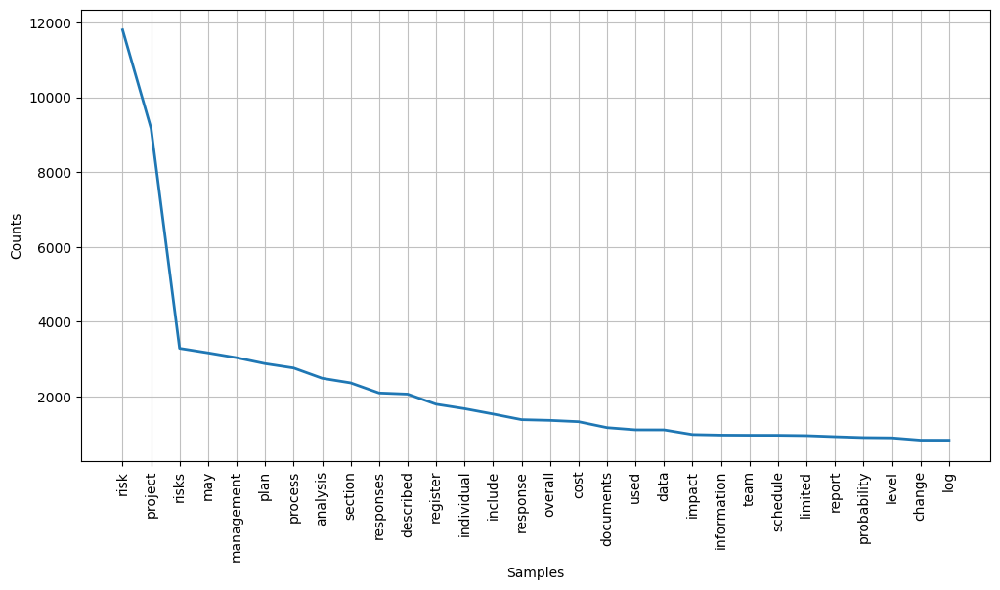

In [ ]:
from nltk.probability import FreqDist
import matplotlib.pyplot as plt

synonyms_flat = [word for sublist in df['tokens'] for word in sublist]

word_freq = FreqDist(synonyms_flat)

plt.figure(figsize=(12, 6))

word_freq.plot(30, cumulative=False)

plt.show()

In [ ]:
##synonyms

In [ ]:
def find_synonyms(word_list):
    synonyms = []

    lemmatizer = WordNetLemmatizer()

    for word in word_list:
        lemmatized_word = lemmatizer.lemmatize(word.lower())

        synsets = wordnet.synsets(lemmatized_word)
        for synset in synsets:
            synonyms.extend(synset.lemma_names())

    return list(set(synonyms))

df['synonyms'] = df['tokens'].apply(find_synonyms)

df


,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content,tokens,synonyms
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...,"[project, risk, management, project, risk, man...","[fulfill, ramp_up, fall_out, stand_for, enjoym..."
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen...","[fulfill, harbour, fall_out, invite, reservati..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen...","[fulfill, harbour, fall_out, invite, reservati..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...,"[project, charter, described, section, project...","[contain, consistent, prerequisite, rank, show..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...,"[project, management, plan, described, section...","[contain, consistent, rank, show, cock, consid..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...,"[work, performance, information, described, se...","[monitor_lizard, disciplinary, fulfill, solve,..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...,"[change, requests, described, section, monitor...","[monitor_lizard, disciplinary, fulfill, contai..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...,"[project, management, plan, updates, change, p...","[monitor_lizard, contain, scrutinise, show, ac..."
108,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.4,11.7.3.4 PROJECT DOCUMENTS UPDATES\n,OUTPUTS,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,11.7.3.4 PROJECT DOCUMENTS UPDATES\n\nProject ...,"['Described in Section 4.1.3.2', 'Described in...",project documents updates project documents ma...,"[project, documents, updates, project, documen...","[monitor_lizard, contain, s

In [ ]:
def find_synonyms(word_list):
    synonyms_dict = {}

    lemmatizer = WordNetLemmatizer()

    for words in word_list:
        for word in words:
            lemmatized_word = lemmatizer.lemmatize(word.lower())
            synsets = wordnet.synsets(lemmatized_word)
            synonyms = []
            for synset in synsets:
                synonyms.extend(synset.lemma_names())
            synonyms_dict[word] = list(set(synonyms))

    return synonyms_dict

synonyms_result = find_synonyms(df['synonyms'])
for word, synonyms in synonyms_result.items():
    print(f'{word}: {synonyms}')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
cohesion: ['cohesion', 'cohesiveness', 'coherence', 'coherency']
care_for: ['care_for', 'hold_dear', 'cherish', 'treat', 'treasure']
identification_number: ['number', 'identification_number']
lodge: ['hostel', 'order', 'lodge', 'Sir_Oliver_Lodge', 'wedge', 'hunting_lodge', 'inn', 'accommodate', 'file', 'hostelry', 'club', 'society', 'deposit', 'gild', 'guild', 'auberge', 'Sir_Oliver_Joseph_Lodge', 'stick', 'social_club', 'Lodge', 'charge', 'indian_lodge']
coping: ['apprehend', 'arrest', 'cope', 'coping', 'knock_off', 'pick_up', 'collar', 'header', 'contend', 'deal', 'manage', 'make_do', 'nail', 'cop', 'thieve', 'get_by', 'make_out', 'grapple', 'snitch', 'hook', 'nab', 'glom']
get_going: ['get_weaving', 'get_rolling', 'go', 'get_going', 'bestir_oneself', 'get_cracking', 'get_started', 'get_moving', 'start']
marketer: ['vendor', 'marketer', 'trafficker', 'seller', 'vender']
degenerate: ['deviate', 'fast', 'riot

In [ ]:
stop_words = set(stopwords.words('english'))

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
df['keywords'] = df['preprocessed_content'].apply(clean_text)
count = CountVectorizer()
tfidf_transformer = TfidfTransformer(smooth_idf=True, use_idf=True)
count.fit(df['keywords'])

for i in range(len(df['keywords'])):
    word_count = count.transform([df['keywords'][i]])
    tfidf_transformer.fit(word_count)

    tf_idf_vector = tfidf_transformer.transform(word_count)
    feature_names = count.get_feature_names_out()

    first_document_vector = tf_idf_vector[0]
    df_tfifd = pd.DataFrame(first_document_vector.T.todense(), index=feature_names, columns=["tfidf"])

    tf_idf = df_tfifd.sort_values(by=["tfidf"], ascending=False)
    tf_idf = tf_idf[tf_idf["tfidf"] != 0.0]

    # Create a new column to store the TF-IDF features for each row
    df['keywords'][i] = tf_idf.index.tolist()


<ipython-input-103-e598f110f468>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['keywords'][i] = tf_idf.index.tolist()
<ipython-input-103-e598f110f468>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['keywords'][i] = tf_idf.index.tolist()
<ipython-input-103-e598f110f468>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['keywords'][i] = tf_idf.index.tolist()
<ipython-input-103-e598f110f468>:21: SettingWithCopyWarning: 
A 

In [ ]:
df

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content,tokens,synonyms,keywords
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...,"[project, risk, management, project, risk, man...","[fulfill, ramp_up, fall_out, stand_for, enjoym...","[project, risk, management, risks, process, pl..."
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen...","[fulfill, harbour, fall_out, invite, reservati...","[risk, project, management, plan, process, imp..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"[plan, risk, management, plan, risk, managemen...","[fulfill, harbour, fall_out, invite, reservati...","[risk, project, management, plan, process, imp..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...,"[project, charter, described, section, project...","[contain, consistent, prerequisite, rank, show...","[project, risk, management, plan, section, pro..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...,"[project, management, plan, described, section...","[contain, consistent, rank, show, cock, consid...","[risk, management, project, plan, process, lim..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...,"[work, performance, information, described, se...","[monitor_lizard, disciplinary, fulfill, solve,...","[risk, project, risks, process, may, section, ..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...,"[change, requests, described, section, monitor...","[monitor_lizard, disciplinary, fulfill, contai...","[risk, project, risks, process, may, change, s..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...,"[project, management, plan, updates, change, p...","[monitor_lizard, contain, scrutinise, show, ac...","[risk, risks, process, project, may, updat

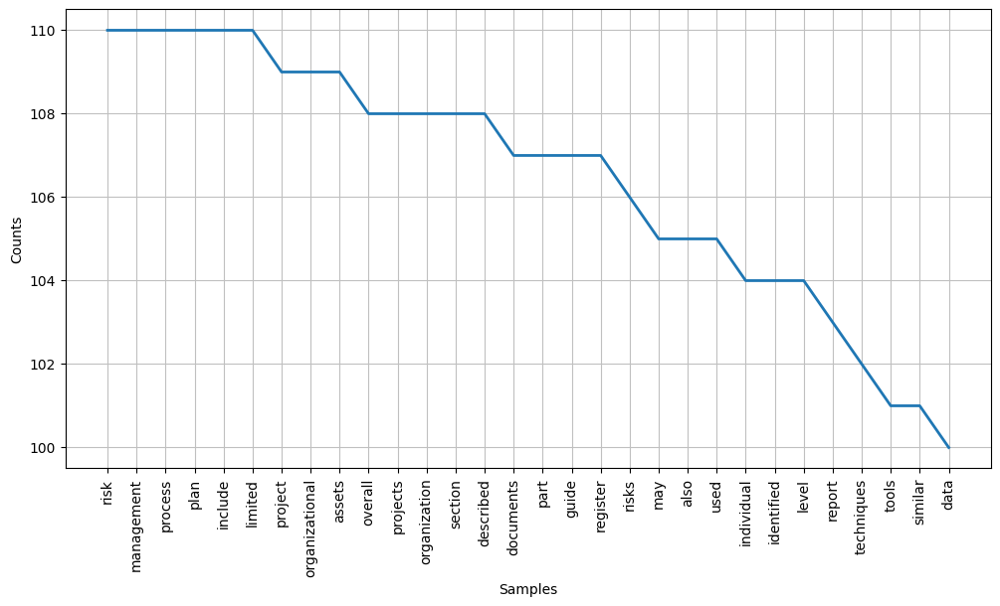

In [ ]:
from nltk.probability import FreqDist
import matplotlib.pyplot as plt

synonyms_flat = [word for sublist in df['keywords'] for word in sublist]

word_freq = FreqDist(synonyms_flat)

plt.figure(figsize=(12, 6))

word_freq.plot(30, cumulative=False)

plt.show()

<hr>

# Part 2 PMI section

## Extracting PMI text

In [ ]:
def pdf_to_images(pdf_file):
    return convert_from_path(pdf_file)

def image_to_txt(image):
    text = image_to_string(image)
    return text

def get_text_from_pdf(pdf_file):
    images = pdf_to_images(pdf_file)
    final_text = ""
    for img in images:
        extracted_text = image_to_txt(img)
        final_text += extracted_text
    return final_text

path = "practice-standard-project-risk-management.pdf"
textextract = get_text_from_pdf(path)
print(textextract)


 

Project Management Institute

PRACTICE STANDARD
FOR PROJECT RISK MANAGEMENT

 
ISBN: 978-1-933890-38-8

Published by:
Project Management Institute, Inc.
14 Campus Boulevard
Newtown Square, Pennsylvania 19073-3299 USA.
Phone: +610-356-4600
Fax: +610-356-4647
E-mail: customercare@pmi.org

Internet: www.pmi.org
©2009 Project Management Institute, Inc. All rights reserved.

“PMI”, the PMI logo, “PMP”, the PMP logo, “PMBOkK”, “PgMP”, “Project Management Journal”, “PM Network”, and the PMI
Today logo are registered marks of Project Management Institute, Inc. The Quarter Globe Design is a trademark of the Project
Management Institute, Inc. For a comprehensive list of PMI marks, contact the PMI Legal Department.

PMI Publications welcomes corrections and comments on its books. Please feel free to send comments on typographical,
formatting, or other errors. Simply make a copy of the relevant page of the book, mark the error, and send it to: Book Editor,
PMI Publications, 14 Campus Boulevard

In [ ]:
# Specify the file name (including the path if needed)
file_name = "PMI.txt"

# Open the file in write mode and write the text content
with open(file_name, 'w', encoding='utf-8') as file:
    file.write(textextract)

print(f'Text saved to {file_name}')

Text saved to PMI.txt


In [ ]:
import re
import pandas as pd

# Read the text from the file
with open('PMI.txt', 'r', encoding='utf-8') as file:
    text = file.read()

text


' \n\nProject Management Institute\n\nPRACTICE STANDARD\nFOR PROJECT RISK MANAGEMENT\n\n \n\x0cISBN: 978-1-933890-38-8\n\nPublished by:\nProject Management Institute, Inc.\n14 Campus Boulevard\nNewtown Square, Pennsylvania 19073-3299 USA.\nPhone: +610-356-4600\nFax: +610-356-4647\nE-mail: customercare@pmi.org\n\nInternet: www.pmi.org\n©2009 Project Management Institute, Inc. All rights reserved.\n\n“PMI”, the PMI logo, “PMP”, the PMP logo, “PMBOkK”, “PgMP”, “Project Management Journal”, “PM Network”, and the PMI\nToday logo are registered marks of Project Management Institute, Inc. The Quarter Globe Design is a trademark of the Project\nManagement Institute, Inc. For a comprehensive list of PMI marks, contact the PMI Legal Department.\n\nPMI Publications welcomes corrections and comments on its books. Please feel free to send comments on typographical,\nformatting, or other errors. Simply make a copy of the relevant page of the book, mark the error, and send it to: Book Editor,\nPMI Pu

## Refrences

### Figures

In [ ]:
figure=re.findall (r"Figure \d+-\d+\. .+",text)
figure

['Figure 1-1. Hierarchy of PMI Project Risk Management Resources',
 'Figure 1-2. Critical Success Factors for Project Risk Management',
 'Figure 3-1. Project Risk Management Process Flow Diagram',
 'Figure 4-1. Key Areas of Focus for the Plan Risk Management Process',
 'Figure 5-1. Three Perspectives of Risk Identification',
 'Figure 5-2. Cause, Risk, and Effect',
 'Figure 6-1. Agreement of the project stakeholders is a fundamental criterion and',
 'Figure 6-2. The Perform Qualitative Risk Analysis Process',
 'Figure 7-1. Comparison of Qualitative and Quantitative Approaches',
 'Figure 7-2. Structure of a Quantitative Risk Analysis',
 'Figure 8-1. Critical Success Factors for Risk Response Planning',
 'Figure 8-2. The Steps Involved in Planning Risk Responses',
 'Figure 8-2. This evaluation should provide an estimate of both the expected',
 'Figure 9-1. Schematic Representation of the Monitor and Control Risks Process']

### Titles

In [ ]:
titles = re.findall(r"(CHAPTER\s\d+|[\d]+\.[\d]+(\.[\d]+)?)\s(.*?)\n", text)

titles = [(match[0] + ' ' + match[2]).strip(' .:') for match in titles]
titles

['CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1',
 '1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2',
 '1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4',
 '1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4',
 '1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5',
 '1.5 Critical Success Factors for Project Risk Management... 6',
 '1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7',
 'CHAPTER 2 - PRINCIPLES AND CONCEPTS..........::::scsssssssssssessssesesssseseenesnensseeneneanenssneneneaneneaees 9',
 '2.1 INtrOMUCTION ........eeseeseeeeeeeeeeeeees 9',
 '2.2 Definition of Project Risk .......ss:sssseseeeee wd',
 '2.3 Individual Risks and Overall Project Risk....

In [ ]:
element_to_find = '9.4 Documenting the Results of the Monitor and Control Risks Process .........0:00 55'
index = titles.index(element_to_find)
print(f"The element {element_to_find} is at index {index}.")

The element 9.4 Documenting the Results of the Monitor and Control Risks Process .........0:00 55 is at index 115.


In [ ]:
index_to_remove_from = 116
if index_to_remove_from < len(titles):
    titles = titles[:index_to_remove_from]

print(titles)

['CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1', '1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2', '1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4', '1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4', '1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5', '1.5 Critical Success Factors for Project Risk Management... 6', '1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7', 'CHAPTER 2 - PRINCIPLES AND CONCEPTS..........::::scsssssssssssessssesesssseseenesnensseeneneanenssneneneaneneaees 9', '2.1 INtrOMUCTION ........eeseeseeeeeeeeeeeeees 9', '2.2 Definition of Project Risk .......ss:sssseseeeee wd', '2.3 Individual Risks and Overall Project Risk....... ww 10'

In [ ]:
cleaned_titles = []
for s in titles:
    parts = s.split('..')
    cleaned_string = parts[0]
    cleaned_titles.append(cleaned_string)

for cleaned_string in cleaned_titles:
    print(cleaned_string)

CHAPTER 1 - INTRODUCTION
1.1 Purpose of the Practice Standard for Project Risk ManagemMehit
1.2 Project Risk Management Definition 
1.3 Role of Project Risk Management in Project Management 
1.4 Good Risk Management Practice
1.5 Critical Success Factors for Project Risk Management
1.6 COMCIUSION 
CHAPTER 2 - PRINCIPLES AND CONCEPTS
2.1 INtrOMUCTION 
2.2 Definition of Project Risk 
2.3 Individual Risks and Overall Project Risk
2.4 Stakeholder Risk Attitudes 
2.5 Iterative PrOCeSS
2.6 COMMUNICATION
2.7 Responsibility for Project Risk Management
2.8 Project Manager’s Role for Project Risk Management
CHAPTER 3 - INTRODUCTION TO PROJECT RISK MANAGEMENT PROCESSES 
3.2 Project Risk Management ProCeSSE 
CHAPTER 4 - PLAN RISK MANAGEMENT 
4.1 Purpose and Objectives of the Plan Risk Management Process
4.2 Critical Success Factors for the Plan Risk Management ProceSS
4.2.1 Identify and Address Barriers to Successful Project
4.2.2 Involve Project Stakeholders in Project Risk Management
4.2.3 Comply

In [ ]:
cleaned_titles


['CHAPTER 1 - INTRODUCTION',
 '1.1 Purpose of the Practice Standard for Project Risk ManagemMehit',
 '1.2 Project Risk Management Definition ',
 '1.3 Role of Project Risk Management in Project Management ',
 '1.4 Good Risk Management Practice',
 '1.5 Critical Success Factors for Project Risk Management',
 '1.6 COMCIUSION ',
 'CHAPTER 2 - PRINCIPLES AND CONCEPTS',
 '2.1 INtrOMUCTION ',
 '2.2 Definition of Project Risk ',
 '2.3 Individual Risks and Overall Project Risk',
 '2.4 Stakeholder Risk Attitudes ',
 '2.5 Iterative PrOCeSS',
 '2.6 COMMUNICATION',
 '2.7 Responsibility for Project Risk Management',
 '2.8 Project Manager’s Role for Project Risk Management',
 'CHAPTER 3 - INTRODUCTION TO PROJECT RISK MANAGEMENT PROCESSES ',
 '3.2 Project Risk Management ProCeSSE ',
 'CHAPTER 4 - PLAN RISK MANAGEMENT ',
 '4.1 Purpose and Objectives of the Plan Risk Management Process',
 '4.2 Critical Success Factors for the Plan Risk Management ProceSS',
 '4.2.1 Identify and Address Barriers to Success

## Dataframe prepation

In [ ]:
df = [[item] for item in cleaned_titles]
df = pd.DataFrame(df)

In [ ]:
df.columns = ['chapter']

In [ ]:
df['title'] = df['chapter']
df.reset_index(drop=True, inplace=True)
df

,chapter,title
0,CHAPTER 1 - INTRODUCTION,CHAPTER 1 - INTRODUCTION
1,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit
2,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition
3,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management
4,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice
5,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management
6,1.6 COMCIUSION,1.6 COMCIUSION
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,CHAPTER 2 - PRINCIPLES AND CONCEPTS
8,2.1 INtrOMUCTION,2.1 INtrOMUCTION
9,2.2 Definition of Project Risk,2.2 Definition of Project Risk


In [ ]:
df['sub-title'] = df['chapter']
df.reset_index(drop=True, inplace=True)
df

,chapter,title,sub-title
0,CHAPTER 1 - INTRODUCTION,CHAPTER 1 - INTRODUCTION,CHAPTER 1 - INTRODUCTION
1,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit
2,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition
3,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management
4,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice
5,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management
6,1.6 COMCIUSION,1.6 COMCIUSION,1.6 COMCIUSION
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,CHAPTER 2 - PRINCIPLES AND CONCEPTS,CHAPTER 2 - PRINCIPLES AND CONCEPTS
8,2.1 INtrOMUCTION,2.1 INtrOMUCTION,2.1 INtrOMUCTION
9,2.2 Definition of Project Risk,2.2 Definition of Project Risk,2.2 Definition of Project Risk


In [ ]:
import numpy as np
# Filter rows based on the subtitles patterns
pattern = r'\d\.\d+\.\d+ '
filtered_rows = df[df['sub-title'].str.match(pattern)]
df.loc[~df.index.isin(filtered_rows.index), 'sub-title'] = np.nan
df.reset_index(drop=True, inplace=True)
df

,chapter,title,sub-title
0,CHAPTER 1 - INTRODUCTION,CHAPTER 1 - INTRODUCTION,NaN
1,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN
2,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition,NaN
3,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management,NaN
4,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice,NaN
5,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management,NaN
6,1.6 COMCIUSION,1.6 COMCIUSION,NaN
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,CHAPTER 2 - PRINCIPLES AND CONCEPTS,NaN
8,2.1 INtrOMUCTION,2.1 INtrOMUCTION,NaN
9,2.2 Definition of Project Risk,2.2 Definition of Project Risk,NaN


In [ ]:
for i in range(1, len(df)):
    current_value = df.loc[i, 'title']
    if not pd.notna(current_value) or not re.match(r'\d\.\d+\s', current_value):
        df.loc[i, 'title'] = df.loc[i - 1, 'title']

df

,chapter,title,sub-title
0,CHAPTER 1 - INTRODUCTION,CHAPTER 1 - INTRODUCTION,NaN
1,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN
2,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition,NaN
3,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management,NaN
4,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice,NaN
5,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management,NaN
6,1.6 COMCIUSION,1.6 COMCIUSION,NaN
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,1.6 COMCIUSION,NaN
8,2.1 INtrOMUCTION,2.1 INtrOMUCTION,NaN
9,2.2 Definition of Project Risk,2.2 Definition of Project Risk,NaN


In [ ]:
import numpy as np
# Filter rows based on the subtitles patterns
pattern = r'\d\.\d\s'
filtered_rows = df[df['title'].str.match(pattern)]
df.loc[~df.index.isin(filtered_rows.index), 'title'] = np.nan
df.reset_index(drop=True, inplace=True)
df

,chapter,title,sub-title
0,CHAPTER 1 - INTRODUCTION,NaN,NaN
1,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN
2,1.2 Project Risk Management Definition,1.2 Project Risk Management Definition,NaN
3,1.3 Role of Project Risk Management in Project Management,1.3 Role of Project Risk Management in Project Management,NaN
4,1.4 Good Risk Management Practice,1.4 Good Risk Management Practice,NaN
5,1.5 Critical Success Factors for Project Risk Management,1.5 Critical Success Factors for Project Risk Management,NaN
6,1.6 COMCIUSION,1.6 COMCIUSION,NaN
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,1.6 COMCIUSION,NaN
8,2.1 INtrOMUCTION,2.1 INtrOMUCTION,NaN
9,2.2 Definition of Project Risk,2.2 Definition of Project Risk,NaN


In [ ]:
for i in range(1, len(df)):
    current_value = df.loc[i, 'chapter']
    if not pd.notna(current_value) or not re.match(r'^CHAPTER\s\d+', current_value):
        df.loc[i, 'chapter'] = df.loc[i - 1, 'chapter']

df

,chapter,title,sub-title
0,CHAPTER 1 - INTRODUCTION,NaN,NaN
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project Management,NaN
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN
5,CHAPTER 1 - INTRODUCTION,1.5 Critical Success Factors for Project Risk Management,NaN
6,CHAPTER 1 - INTRODUCTION,1.6 COMCIUSION,NaN
7,CHAPTER 2 - PRINCIPLES AND CONCEPTS,1.6 COMCIUSION,NaN
8,CHAPTER 2 - PRINCIPLES AND CONCEPTS,2.1 INtrOMUCTION,NaN
9,CHAPTER 2 - PRINCIPLES AND CONCEPTS,2.2 Definition of Project Risk,NaN


In [ ]:
df.loc[25, 'sub-title'] = '4.3.1 Planning Sessions'
df.loc[26, 'sub-title'] = '4.3.2 Templates'
df.loc[42, 'sub-title'] = '5.3.1 Historical Review'
df.loc[43, 'sub-title'] = '5.3.2 Current Assessments'
df.loc[44, 'sub-title'] = '5.3.3 Creativity Techniques'
df.loc[51, 'sub-title'] = '6.2.3 Collect High-Quality Information about risks'
df.loc[52, 'sub-title'] = '6.2.4 Perform Iterative Qualitative Risk Analysis'
df.loc[55,'sub-title'] = '6.3.2 Collect and Analyze Data'
df.loc[68, 'sub-title'] = '6.3.5 Categorize Risk Causes'
df.loc[64, 'sub-title'] = '7.2.2 Appropriate Project Model'
df.loc[66, 'sub-title'] = '7.2.4 Unbiased Data'
df.loc[67, 'sub-title'] = '7.2.5 Overall Project Risk Derived from Individual Risks'
df.loc[93, 'sub-title'] = '8.3.4 Accept a Threat or an Opportunity'
df.loc[98, 'sub-title'] = '8.4.3 Action Planning'
df.loc[111, 'sub-title'] = '9.3.1 Managing Contingency Reserves'
df.loc[112, 'sub-title'] = '9.3.2 Tracking Trigger Conditions'
df.loc[114, 'sub-title'] = '9.3.4 Tracking Compliance'


In [ ]:
columns_to_copy = ['sub-title']
copied_columns_df = df[columns_to_copy]

In [ ]:
# Remove rows with NaN values
df_cleaned = copied_columns_df.dropna()

# Display the cleaned DataFrame
print(df_cleaned)

                                                                    sub-title
21                  4.2.1 Identify and Address Barriers to Successful Project
22              4.2.2 Involve Project Stakeholders in Project Risk Management
23   4.2.3 Comply with the Organization’s Objectives, Policies, and Practices
25                                                    4.3.1 Planning Sessions
26                                                            4.3.2 Templates
31                                                 5.2.1 Early Identification
32                                            5.2.2 Iterative Identification 
33                                              5.2.3 Emergent Identification
34                                        5.2.4 Comprehensive Identification 
35                            5.2.5 Explicit Identification of Opportunities 
36                                               5.2.6 Multiple Perspectives 
37                                  5.2.7 Risks Linked to Projec

In [ ]:
sections = []
for index, row in df_cleaned.iterrows():
    subtitle = row['sub-title']
    next_subtitle = df_cleaned.iloc[index + 1]['sub-title'] if index + 1 < len(df_cleaned) else None

    # Check if subtitle is 'nan' (missing) and replace with "subtitle not found"
    if pd.isna(subtitle):
        subtitle = "subtitle not found"

    # Check if next_subtitle is 'nan' (missing) and replace with None
    if pd.isna(next_subtitle):
        next_subtitle = None

    start_index = text.find(subtitle)
    end_index = text.find(next_subtitle) if next_subtitle else None

    section = text[start_index:end_index].strip() if end_index else text[start_index:].strip()
    sections.append(section)

df_cleaned['subtitlecontent'] = sections

<ipython-input-369-659a9df00ee2>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['subtitlecontent'] = sections


In [ ]:
df['subtitlecontent']=''

In [ ]:
for i, row1 in df.iterrows():

    for j, row2 in df_cleaned.iterrows():
        if row1['sub-title'] == row2['sub-title']:
            df.at[i, 'subtitlecontent'] = row2['subtitlecontent']

In [ ]:
columns_to_copy = ['title']
copied_columns_df = df[columns_to_copy]

In [ ]:
# Remove rows with NaN values
df_cleaned = copied_columns_df.dropna()

# Display the cleaned DataFrame
print(df_cleaned)

                                                                                title
1                  1.1 Purpose of the Practice Standard for Project Risk ManagemMehit
2                                             1.2 Project Risk Management Definition 
3                          1.3 Role of Project Risk Management in Project Management 
4                                                   1.4 Good Risk Management Practice
5                            1.5 Critical Success Factors for Project Risk Management
6                                                                     1.6 COMCIUSION 
7                                                                     1.6 COMCIUSION 
8                                                                   2.1 INtrOMUCTION 
9                                                     2.2 Definition of Project Risk 
10                                      2.3 Individual Risks and Overall Project Risk
11                                                    

In [ ]:
df['titlecontent']=''

In [ ]:
sections = []
for index, row in df_cleaned.iterrows():
    subtitle = row['title']
    next_subtitle = df_cleaned.iloc[index + 1]['title'] if index + 1 < len(df_cleaned) else None

    # Check if subtitle is 'nan' (missing) and replace with "subtitle not found"
    if pd.isna(subtitle):
        subtitle = "title not found"

    # Check if next_subtitle is 'nan' (missing) and replace with None
    if pd.isna(next_subtitle):
        next_subtitle = None

    start_index = text.find(subtitle)
    end_index = text.find(next_subtitle) if next_subtitle else None

    section = text[start_index:end_index].strip() if end_index else text[start_index:].strip()
    sections.append(section)

df_cleaned['titlecontent'] = sections

<ipython-input-375-78717015f63e>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['titlecontent'] = sections


In [ ]:
for i, row1 in df.iterrows():

    for j, row2 in df_cleaned.iterrows():
        if row1['title'] == row2['title']:
            df.at[i, 'titlecontent'] = row2['titlecontent']

In [ ]:
df.head()

,chapter,title,sub-title,subtitlecontent,titlecontent
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,,
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN,,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,,1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project Management,NaN,,1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,,1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6


In [ ]:
df['chaptercontent']=''

In [ ]:
columns_to_copy = ['chapter']
copied_columns_df = df[columns_to_copy]

In [ ]:
# Remove rows with NaN values
df_cleaned = copied_columns_df.dropna()

# Display the cleaned DataFrame
print(df_cleaned)

                                                            chapter
0                                          CHAPTER 1 - INTRODUCTION
1                                          CHAPTER 1 - INTRODUCTION
2                                          CHAPTER 1 - INTRODUCTION
3                                          CHAPTER 1 - INTRODUCTION
4                                          CHAPTER 1 - INTRODUCTION
5                                          CHAPTER 1 - INTRODUCTION
6                                          CHAPTER 1 - INTRODUCTION
7                               CHAPTER 2 - PRINCIPLES AND CONCEPTS
8                               CHAPTER 2 - PRINCIPLES AND CONCEPTS
9                               CHAPTER 2 - PRINCIPLES AND CONCEPTS
10                              CHAPTER 2 - PRINCIPLES AND CONCEPTS
11                              CHAPTER 2 - PRINCIPLES AND CONCEPTS
12                              CHAPTER 2 - PRINCIPLES AND CONCEPTS
13                              CHAPTER 2 - PRIN

In [ ]:
sections = []
for index, row in df_cleaned.iterrows():
    subtitle = row['chapter']
    next_subtitle = df_cleaned.iloc[index + 1]['chapter'] if index + 1 < len(df_cleaned) else None

    # Check if subtitle is 'nan' (missing) and replace with "subtitle not found"
    if pd.isna(subtitle):
        subtitle = "chapter not found"

    # Check if next_subtitle is 'nan' (missing) and replace with None
    if pd.isna(next_subtitle):
        next_subtitle = None

    start_index = text.find(subtitle)
    end_index = text.find(next_subtitle) if next_subtitle else None

    section = text[start_index:end_index].strip() if end_index else text[start_index:].strip()
    sections.append(section)

df_cleaned['chaptercontent'] = sections

In [ ]:
for i, row1 in df.iterrows():

    for j, row2 in df_cleaned.iterrows():
        if row1['chapter'] == row2['chapter']:
            df.at[i, 'chaptercontent'] = row2['chaptercontent']

In [ ]:
df = df.fillna(np.nan)

In [ ]:
empty_columns = df.columns[df.isnull().all()]
df[empty_columns] = np.nan

In [ ]:
df = df.replace(' ', np.nan)

In [ ]:
df.head()

,chapter,title,sub-title,subtitlecontent,titlecontent,chaptercontent
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,,,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN,,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,,1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project Management,NaN,,1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,,1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecss

In [ ]:
def merge_values(row):
    if row['subtitlecontent'] == '':
        return row['titlecontent']
    return row['subtitlecontent']

# Apply the custom function to create the 'merged' column
df['merged'] = df.apply(merge_values, axis=1)

In [ ]:
df.tail()

chapter  \
111  CHAPTER 9 - MONITOR AND CONTROL RISKS   
112  CHAPTER 9 - MONITOR AND CONTROL RISKS   
113  CHAPTER 9 - MONITOR AND CONTROL RISKS   
114  CHAPTER 9 - MONITOR AND CONTROL RISKS   
115  CHAPTER 9 - MONITOR AND CONTROL RISKS   

                                                                     title  \
111     9.3 Tools and Techniques for the Monitor and Control Risks Process   
112     9.3 Tools and Techniques for the Monitor and Control Risks Process   
113     9.3 Tools and Techniques for the Monitor and Control Risks Process   
114     9.3 Tools and Techniques for the Monitor and Control Risks Process   
115  9.4 Documenting the Results of the Monitor and Control Risks Process    

                               sub-title  \
111  9.3.1 Managing Contingency Reserves   
112    9.3.2 Tracking Trigger Conditions   
113          9.3.3 Tracking Overall Risk   
114            9.3.4 Tracking Compliance   
115                                  NaN   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [ ]:
def merge_values(row):
    if row['merged'] == '':
        return row['chaptercontent']
    return row['merged']

# Apply the custom function to create the 'merged' column
df['content'] = df.apply(merge_values, axis=1)

df.head()

,chapter,title,sub-title,subtitlecontent,titlecontent,chaptercontent,merged,content
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,,,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7,,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN,,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,,1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7,1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssessesee

In [ ]:
df.drop(['subtitlecontent', 'titlecontent', 'chaptercontent','merged'], axis=1, inplace=True)

In [ ]:
df.head()

,chapter,title,sub-title,content
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscsssssesssseseecsseseenessenssesneneanensaesneneanensseeneneanensneneneaneneaees 1\n1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6\n1.6 COMCIUSION .......c.cccsseeseeeesetsteeeeeeeneeenetenecneeecaneseneneneteneananeneneseneneneneneneeenenesenenenenennane 7
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit,NaN,1.1 Purpose of the Practice Standard for Project Risk ManagemMehit.......0:0:sssee 2\n1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ...........cccscssssseseeeeeseeseessseeneeeeeeeeneneeneeans 4\n1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project Management,NaN,1.3 Role of Project Risk Management in Project Management ..........cscsssesseseens 4\n1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........csscssssesseesssecseeeeeseeeseeeseeeneeeeeeeeneneeeeeeeans 5\n1.5 Critical Success Factors for Project Risk Management... 6


In [ ]:
df

,chapter,title,sub-title,content
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...
...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...


In [ ]:
df['Definition'] = df['content']
df=df.replace({'Definition':'Described in Section [0-9].*'},{'Definition':''} , regex=True)
df=df.replace({'Definition':'depicted in Section [0-9].*'},{'Definition':''} , regex=True)
df

,chapter,title,sub-title,content,Definition
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...
...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...


In [ ]:
df['REF']=df['content'].str.findall(r'described in sections \d.\d.\d.\d+')
df['REF']=df['REF']+df['content'].str.findall(r'Figure \d+')
df['REF']=df['REF']+df['content'].str.findall(r'Figure \d\d+')

In [ ]:
df

,chapter,title,sub-title,content,Definition,REF
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[]
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[]
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[]
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[]
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[]
...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[]
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[]
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"[Figure 1, Figure 1, Figure 3, Figure 4, Figur..."
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[]


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer


In [ ]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
def clean_text(text):
    #lowercase
    text = text.lower()

    # remove square brackets
    text = re.sub(r'\[.*?\]', '', text)

    #remove URLs and links
    text = re.sub(r'https?://\S+|www\.\S+', '', text)

    # other html tags
    text = re.sub(r'<.*?>', '', text)

    # non-alphanumeric characters
    text = re.sub(r'[^a-zA-Z0-9]', ' ', text)

    # Tokenize the text
    words = word_tokenize(text)

    # Remove stopwords
    words = [word for word in words if word not in stopwords.words('english')]

    # Remove words containing numbers
    words = [word for word in words if not any(char.isdigit() for char in word)]

    # Join the cleaned words back into a single string
    cleaned_text = ' '.join(words)

    return cleaned_text

In [ ]:
df['preprocessed_content'] = df['content'].apply(lambda x : clean_text(x))
df

,chapter,title,sub-title,content,Definition,REF,preprocessed_content
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[],chapter introduction cccssscsssssesssseseecsse...
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[],purpose practice standard project risk managem...
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[],project risk management definition cccscssssse...
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[],role project risk management project managemen...
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[],good risk management practice csscssssesseesss...
...,...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[],managing contingency reserves reserves may all...
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[],tracking trigger conditions trigger conditions...
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"[Figure 1, Figure 1, Figure 3, Figure 4, Figur...",tracking overall risk ccssccsscsssesssseseesse...
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[],tracking compliance order monitor quality exec...


In [ ]:
df['tokens'] = df['preprocessed_content'].apply(word_tokenize)
df

,chapter,title,sub-title,content,Definition,REF,preprocessed_content,tokens
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[],chapter introduction cccssscsssssesssseseecsse...,"[chapter, introduction, cccssscsssssesssseseec..."
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[],purpose practice standard project risk managem...,"[purpose, practice, standard, project, risk, m..."
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[],project risk management definition cccscssssse...,"[project, risk, management, definition, cccscs..."
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[],role project risk management project managemen...,"[role, project, risk, management, project, man..."
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[],good risk management practice csscssssesseesss...,"[good, risk, management, practice, csscssssess..."
...,...,...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[],managing contingency reserves reserves may all...,"[managing, contingency, reserves, reserves, ma..."
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[],tracking trigger conditions trigger conditions...,"[tracking, trigger, conditions, trigger, condi..."
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"[Figure 1, Figure 1, Figure 3, Figure 4, Figur...",tracking overall risk ccssccsscsssesssseseesse...,"[tracking, overall, risk, ccssccsscsssessssese..."
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[],tracking compliance order monitor quality exec...,"[tracking, compliance, order, monitor, quality..."


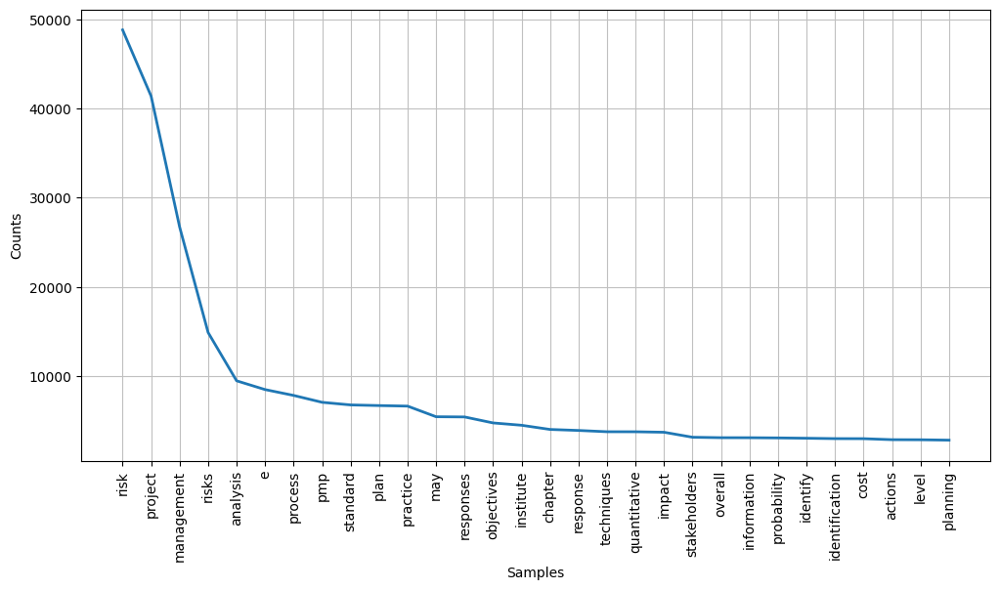

In [ ]:
from nltk.probability import FreqDist
import matplotlib.pyplot as plt

synonyms_flat = [word for sublist in df['tokens'] for word in sublist]

word_freq = FreqDist(synonyms_flat)

plt.figure(figsize=(12, 6))

word_freq.plot(30, cumulative=False)

plt.show()

In [ ]:

from nltk.corpus import wordnet

In [ ]:
def find_synonyms(word_list):
    synonyms = []

    lemmatizer = WordNetLemmatizer()

    for word in word_list:
        lemmatized_word = lemmatizer.lemmatize(word.lower())

        synsets = wordnet.synsets(lemmatized_word)
        for synset in synsets:
            synonyms.extend(synset.lemma_names())

    return list(set(synonyms))

df['synonyms'] = df['tokens'].apply(find_synonyms)

df

,chapter,title,sub-title,content,Definition,REF,preprocessed_content,tokens,synonyms
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[],chapter introduction cccssscsssssesssseseecsse...,"[chapter, introduction, cccssscsssssesssseseec...","[foundation, risk_of_exposure, theatrical_role..."
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[],purpose practice standard project risk managem...,"[purpose, practice, standard, project, risk, m...","[risk_of_exposure, definition, practice_sessio..."
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[],project risk management definition cccscssssse...,"[project, risk, management, definition, cccscs...","[risk_of_exposure, definition, theatrical_role..."
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[],role project risk management project managemen...,"[role, project, risk, management, project, man...","[theatrical_role, risk_of_exposure, serious, v..."
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[],good risk management practice csscssssesseesss...,"[good, risk, management, practice, csscssssess...","[risk_of_exposure, serious, winner, visualise,..."
...,...,...,...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[],managing contingency reserves reserves may all...,"[managing, contingency, reserves, reserves, ma...","[offer_up, wage_hike, conflate, Ulysses_S._Gra..."
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[],tracking trigger conditions trigger conditions...,"[tracking, trigger, conditions, trigger, condi...","[offer_up, wage_hike, conflate, Ulysses_S._Gra..."
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"[Figure 1, Figure 1, Figure 3, Figure 4, Figur...",tracking overall risk ccssccsscsssesssseseesse...,"[tracking, overall, risk, ccssccsscsssessssese...","[offer_up, wage_hike, conflate, Ulysses_S._Gra..."
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[],tracking compliance order monitor quality exec...,"[tracking, compliance, order, monitor, quality...","[offer_up, wage_hike, conflate, Ulysses_S._Gra..."


In [ ]:
def find_synonyms(word_list):
    synonyms_dict = {}

    lemmatizer = WordNetLemmatizer()

    for words in word_list:
        for word in words:
            lemmatized_word = lemmatizer.lemmatize(word.lower())
            synsets = wordnet.synsets(lemmatized_word)
            synonyms = []
            for synset in synsets:
                synonyms.extend(synset.lemma_names())
            synonyms_dict[word] = list(set(synonyms))

    return synonyms_dict

synonyms_result = find_synonyms(df['synonyms'])
for word, synonyms in synonyms_result.items():
    print(f'{word}: {synonyms}')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
throughout: ['end-to-end', 'passim', 'throughout']
examination: ['test', 'testing', 'interrogation', 'examination', 'interrogatory', 'scrutiny', 'exam', 'examen']
comprise: ['be', 'contain', 'constitute', 'represent', 'consist', 'incorporate', 'comprise', 'make_up']
stern: ['buns', 'backside', 'stern', 'tail_end', 'Isaac_Stern', 'prat', 'fundament', 'severe', 'relentless', 'unappeasable', 'stark', 'hind_end', 'keister', 'behind', 'butt', 'rear_end', 'quarter', 'posterior', 'derriere', 'can', 'unrelenting', 'Stern', 'grim', 'rear', 'bottom', 'hindquarters', 'bum', 'austere', 'ass', 'poop', 'rump', 'unforgiving', 'exacting', 'inexorable', 'buttocks', 'tooshie', 'arse', 'seat', 'fanny', 'tush', 'tail', 'nates', 'strict', 'after_part']
rudimentary: ['rudimentary', 'vestigial', 'underlying', 'fundamental']
reasonable: ['fair', 'fairish', 'sane', 'sensible', 'reasonable']
ACE: ['tops', 'star', 'hotshot', 'mavin', '

In [ ]:
stop_words = set(stopwords.words('english'))

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
df['keywords'] = df['preprocessed_content'].apply(clean_text)
count = CountVectorizer()
tfidf_transformer = TfidfTransformer(smooth_idf=True, use_idf=True)
count.fit(df['keywords'])

for i in range(len(df['keywords'])):
    word_count = count.transform([df['keywords'][i]])
    tfidf_transformer.fit(word_count)

    tf_idf_vector = tfidf_transformer.transform(word_count)
    feature_names = count.get_feature_names_out()

    first_document_vector = tf_idf_vector[0]
    df_tfifd = pd.DataFrame(first_document_vector.T.todense(), index=feature_names, columns=["tfidf"])

    tf_idf = df_tfifd.sort_values(by=["tfidf"], ascending=False)
    tf_idf = tf_idf[tf_idf["tfidf"] != 0.0]

    # Create a new column to store the TF-IDF features for each row
    df['keywords'][i] = tf_idf.index.tolist()

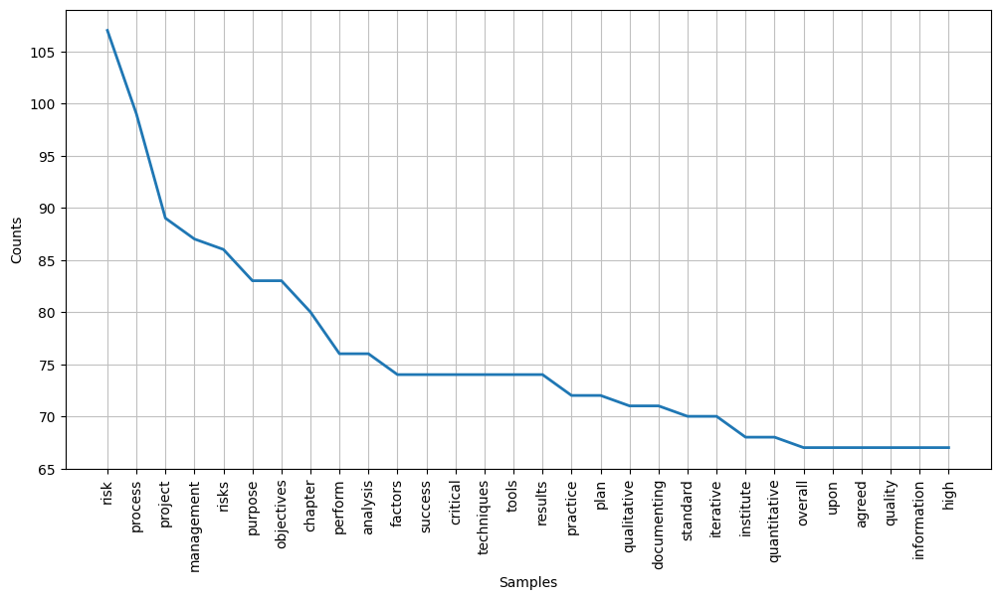

In [ ]:
from nltk.probability import FreqDist
import matplotlib.pyplot as plt

synonyms_flat = [word for sublist in df['keywords'] for word in sublist]

word_freq = FreqDist(synonyms_flat)

plt.figure(figsize=(12, 6))

word_freq.plot(30, cumulative=False)

plt.show()

In [ ]:
df

,chapter,title,sub-title,content,Definition,REF,preprocessed_content,tokens,synonyms,keywords
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[],chapter introduction cccssscsssssesssseseecsse...,"[chapter, introduction, cccssscsssssesssseseec...","[foundation, risk_of_exposure, theatrical_role...","[project, management, risk, practice, factors,..."
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[],purpose practice standard project risk managem...,"[purpose, practice, standard, project, risk, m...","[risk_of_exposure, definition, practice_sessio...","[risk, project, purpose, managemmehit, sssee, ..."
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[],project risk management definition cccscssssse...,"[project, risk, management, definition, cccscs...","[risk_of_exposure, definition, theatrical_role...","[management, project, risk, definition, cccscs..."
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[],role project risk management project managemen...,"[role, project, risk, management, project, man...","[theatrical_role, risk_of_exposure, serious, v...","[management, risk, project, practice, cscssses..."
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[],good risk management practice csscssssesseesss...,"[good, risk, management, practice, csscssssess...","[risk_of_exposure, serious, winner, visualise,...","[risk, management, success, critical, project,..."
...,...,...,...,...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[],managing contingency reserves reserves may all...,"[managing, contingency, reserves, reserves, ma...","[offer_up, wage_hike, conflate, Ulysses_S._Gra...","[risk, project, management, pmp, risks, analys..."
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[],tracking trigger conditions trigger conditions...,"[tracking, trigger, conditions, trigger, condi...","[offer_up, wage_hike, conflate, Ulysses_S._Gra...","[risk, project, management, pmp, risks, analys..."
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"[Figure 1, Figure 1, Figure 3, Figure 4, Figur...",tracking overall risk ccssccsscsssesssseseesse...,"[tracking, overall, risk, ccssccsscsssessssese...","[offer_up, wage_hike, conflate, Ulysses_S._Gra...","[risk, project, management, risks, analysis, p..."
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[],tracking compliance order monitor quality exec...,"[tracking, compliance, order, monitor, quality...","[offer_up, wage_hike, conflate, Ulysses_S._Gra...","[risk, project, management, pmp, risks, analys..."


<hr>

# Part 3 : Merging content

In [ ]:
df1 = pd.read_csv('PMBOOK.CSV')
df2 = pd.read_csv('PMI.csv')

In [ ]:
df1

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content,tokens,synonyms,keywords
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...,"['project', 'risk', 'management', 'project', '...","['fulfill', 'ramp_up', 'fall_out', 'stand_for'...","['project', 'risk', 'management', 'risks', 'pr..."
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"['plan', 'risk', 'management', 'plan', 'risk',...","['fulfill', 'harbour', 'fall_out', 'invite', '...","['risk', 'project', 'management', 'plan', 'pro..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"['plan', 'risk', 'management', 'plan', 'risk',...","['fulfill', 'harbour', 'fall_out', 'invite', '...","['risk', 'project', 'management', 'plan', 'pro..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...,"['project', 'charter', 'described', 'section',...","['contain', 'consistent', 'prerequisite', 'ran...","['project', 'risk', 'management', 'plan', 'sec..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...,"['project', 'management', 'plan', 'described',...","['contain', 'consistent', 'rank', 'show', 'coc...","['risk', 'management', 'project', 'plan', 'pro..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...,"['work', 'performance', 'information', 'descri...","['monitor_lizard', 'disciplinary', 'fulfill', ...","['risk', 'project', 'risks', 'process', 'may',..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...,"['change', 'requests', 'described', 'section',...","['monitor_lizard', 'disciplinary', 'fulfill', ...","['risk', 'project', 'risks', 'process', 'may',..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...,"['project', 'management', 'plan', 'updates', '...","['monitor_lizard', 'contain', 'scrutinise', 's...","['risk', 'risks', 'process', 'project', 'm

In [ ]:
df2

,chapter,title,sub-title,content,Definition,REF,preprocessed_content,tokens,synonyms,keywords
0,CHAPTER 1 - INTRODUCTION,NaN,NaN,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,CHAPTER 1 - INTRODUCTION.........::cccssscssss...,[],chapter introduction cccssscsssssesssseseecsse...,"['chapter', 'introduction', 'cccssscsssssessss...","['foundation', 'risk_of_exposure', 'theatrical...","['project', 'management', 'risk', 'practice', ..."
1,CHAPTER 1 - INTRODUCTION,1.1 Purpose of the Practice Standard for Proje...,NaN,1.1 Purpose of the Practice Standard for Proje...,1.1 Purpose of the Practice Standard for Proje...,[],purpose practice standard project risk managem...,"['purpose', 'practice', 'standard', 'project',...","['risk_of_exposure', 'definition', 'practice_s...","['risk', 'project', 'purpose', 'managemmehit',..."
2,CHAPTER 1 - INTRODUCTION,1.2 Project Risk Management Definition,NaN,1.2 Project Risk Management Definition ..........,1.2 Project Risk Management Definition ..........,[],project risk management definition cccscssssse...,"['project', 'risk', 'management', 'definition'...","['risk_of_exposure', 'definition', 'theatrical...","['management', 'project', 'risk', 'definition'..."
3,CHAPTER 1 - INTRODUCTION,1.3 Role of Project Risk Management in Project...,NaN,1.3 Role of Project Risk Management in Project...,1.3 Role of Project Risk Management in Project...,[],role project risk management project managemen...,"['role', 'project', 'risk', 'management', 'pro...","['theatrical_role', 'risk_of_exposure', 'serio...","['management', 'risk', 'project', 'practice', ..."
4,CHAPTER 1 - INTRODUCTION,1.4 Good Risk Management Practice,NaN,1.4 Good Risk Management Practice..........css...,1.4 Good Risk Management Practice..........css...,[],good risk management practice csscssssesseesss...,"['good', 'risk', 'management', 'practice', 'cs...","['risk_of_exposure', 'serious', 'winner', 'vis...","['risk', 'management', 'success', 'critical', ..."
...,...,...,...,...,...,...,...,...,...,...
111,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.1 Managing Contingency Reserves,9.3.1 Managing Contingency Reserves\n\nReserve...,9.3.1 Managing Contingency Reserves\n\nReserve...,[],managing contingency reserves reserves may all...,"['managing', 'contingency', 'reserves', 'reser...","['offer_up', 'wage_hike', 'conflate', 'Ulysses...","['risk', 'project', 'management', 'pmp', 'risk..."
112,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.2 Tracking Trigger Conditions,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,9.3.2 Tracking Trigger Conditions\n\n \n\nTrig...,[],tracking trigger conditions trigger conditions...,"['tracking', 'trigger', 'conditions', 'trigger...","['offer_up', 'wage_hike', 'conflate', 'Ulysses...","['risk', 'project', 'management', 'pmp', 'risk..."
113,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.3 Tracking Overall Risk,9.3.3 Tracking Overall Risk........ccssccsscss...,9.3.3 Tracking Overall Risk........ccssccsscss...,"['Figure 1', 'Figure 1', 'Figure 3', 'Figure 4...",tracking overall risk ccssccsscsssesssseseesse...,"['tracking', 'overall', 'risk', 'ccssccsscssse...","['offer_up', 'wage_hike', 'conflate', 'Ulysses...","['risk', 'project', 'management', 'risks', 'an..."
114,CHAPTER 9 - MONITOR AND CONTROL RISKS,9.3 Tools and Techniques for the Monitor and C...,9.3.4 Tracking Compliance,9.3.4 Tracking Compliance\n\nIn order to monit...,9.3.4 Tracking Compliance\n\nIn order to monit...,[],tracking compliance order monitor quality exec...,"['tracking', 'compliance', 'order', 'monitor',...","['offer_up', 'wage_hike', 'conflate', 'Ulysses...","['risk', 'project', 'management', 'pmp', 'risk..."


In [ ]:
# Calculate TF-IDF vectors for the "Definition" column in both DataFrames
vectorizer = TfidfVectorizer()
tfidf_matrix1 = vectorizer.fit_transform(df1['Definition'])
tfidf_matrix2 = vectorizer.transform(df2['Definition'])

# Calculate cosine similarity
similarity_matrix = cosine_similarity(tfidf_matrix1, tfidf_matrix2)

# Set a similarity threshold
threshold = 0.7

# Iterate through df1 to find and merge similar rows from df2
for i, row1 in df1.iterrows():
    matched_definitions = []
    matched_synonyms = []
    matched_refs = []
    for j, score in enumerate(similarity_matrix[i]):
        if score >= threshold:
            matched_definitions.append(df2.at[j, 'Definition'])
            matched_synonyms.extend(df2.at[j, 'REF'])
            matched_refs.append(df2.at[j, 'preprocessed_content'])
            matched_refs.append(df2.at[j, 'tokens'])
            matched_refs.append(df2.at[j, 'synonyms'])
            matched_refs.append(df2.at[j, 'keywords'])

    # Merge the matched data
    df1.at[i, 'Definition'] += ' and ' + ' and '.join(matched_definitions)
    df1.at[i, 'REF'].join(matched_synonyms)
    df1.at[i, 'preprocessed_content'] += ', ' + ', '.join(matched_refs)
    df1.at[i, 'tokens'] += ', ' + ', '.join(matched_refs)
    df1.at[i, 'synonyms'] += ', ' + ', '.join(matched_refs)
    df1.at[i, 'keywords'] += ', ' + ', '.join(matched_refs)

# Print the updated df1
print(df1)


     number of chapter                  chapter  Number of Process  \
0                   11  PROJECT RISK MANAGEMENT                NaN   
1                   11  PROJECT RISK MANAGEMENT               11.1   
2                   11  PROJECT RISK MANAGEMENT               11.1   
3                   11  PROJECT RISK MANAGEMENT               11.1   
4                   11  PROJECT RISK MANAGEMENT               11.1   
..                 ...                      ...                ...   
105                 11  PROJECT RISK MANAGEMENT               11.7   
106                 11  PROJECT RISK MANAGEMENT               11.7   
107                 11  PROJECT RISK MANAGEMENT               11.7   
108                 11  PROJECT RISK MANAGEMENT               11.7   
109                 11  PROJECT RISK MANAGEMENT               11.7   

                    concept Number of title                          titles  \
0                       NaN             NaN                             NaN   
1

In [ ]:
df1

,number of chapter,chapter,Number of Process,concept,Number of title,titles,Number of subtitle,subtitle,type,content,Definition,REF,preprocessed_content,tokens,synonyms,keywords
0,11,PROJECT RISK MANAGEMENT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,PROJECT RISK MANAGEMENT\n\nProject Risk Manage...,"['Figure 11', 'Figure 11']",project risk management project risk managemen...,"['project', 'risk', 'management', 'project', '...","['fulfill', 'ramp_up', 'fall_out', 'stand_for'...","['project', 'risk', 'management', 'risks', 'pr..."
1,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,NaN,NaN,NaN,NaN,NaN,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"['plan', 'risk', 'management', 'plan', 'risk',...","['fulfill', 'harbour', 'fall_out', 'invite', '...","['risk', 'project', 'management', 'plan', 'pro..."
2,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,NaN,NaN,INPUTS,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,PLAN RISK MANAGEMENT\n\nPlan Risk Management i...,"['Described in Section 4.1.3.1', 'Described in...",plan risk management plan risk management proc...,"['plan', 'risk', 'management', 'plan', 'risk',...","['fulfill', 'harbour', 'fall_out', 'invite', '...","['risk', 'project', 'management', 'plan', 'pro..."
3,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.1,11.1.1.1 PROJECT CHARTER\n,INPUTS,11.1.1.1 PROJECT CHARTER\n\nDescribed in Secti...,11.1.1.1 PROJECT CHARTER\n\n\n\nlevel requirem...,"['Described in Section 4.1.3.1', 'Described in...",project charter described section project char...,"['project', 'charter', 'described', 'section',...","['contain', 'consistent', 'prerequisite', 'ran...","['project', 'risk', 'management', 'plan', 'sec..."
4,11,PROJECT RISK MANAGEMENT,11.1,PLAN RISK MANAGEMENT\n,11.1.1,PLAN RISK MANAGEMENT: INPUTS\n,11.1.1.2,11.1.1.2 PROJECT MANAGEMENT PLAN\n,INPUTS,11.1.1.2 PROJECT MANAGEMENT PLAN\n\nDescribed ...,11.1.1.2 PROJECT MANAGEMENT PLAN\n\n\nshould b...,['Described in Section 4.2.3.1'],project management plan described section plan...,"['project', 'management', 'plan', 'described',...","['contain', 'consistent', 'rank', 'show', 'coc...","['risk', 'management', 'project', 'plan', 'pro..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.1,11.7.3.1 WORK PERFORMANCE INFORMATION\n,OUTPUTS,11.7.3.1 WORK PERFORMANCE INFORMATION\n\nDescr...,11.7.3.1 WORK PERFORMANCE INFORMATION\n\n\nis ...,"['Described in Section 4.5.1.3', 'Described in...",work performance information described section...,"['work', 'performance', 'information', 'descri...","['monitor_lizard', 'disciplinary', 'fulfill', ...","['risk', 'project', 'risks', 'process', 'may',..."
106,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.2,11.7.3.2 CHANGE REQUESTS\n,OUTPUTS,11.7.3.2 CHANGE REQUESTS\n\nDescribed in Secti...,11.7.3.2 CHANGE REQUESTS\n\n\nbaselines or oth...,"['Described in Section 4.3.3.4', 'Described in...",change requests described section monitor risk...,"['change', 'requests', 'described', 'section',...","['monitor_lizard', 'disciplinary', 'fulfill', ...","['risk', 'project', 'risks', 'process', 'may',..."
107,11,PROJECT RISK MANAGEMENT,11.7,MONITOR RISKS\n,11.7.3,MONITOR RISKS: OUTPUTS\n,11.7.3.3,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n,OUTPUTS,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,11.7.3.3 PROJECT MANAGEMENT PLAN UPDATES\n\nAn...,"['Described in Section 4.1.3.2', 'Described in...",project management plan updates change project...,"['project', 'management', 'plan', 'updates', '...","['monitor_lizard', 'contain', 'scrutinise', 's...","['risk', 'risks', 'process', 'project', 'm